## Analytical slope revision

In [2]:
# Add percentage of contact area in transition process
# Add auxiliary line to compare with slopes: $\frac{1}{\tau_1}$ and $\frac{1}{\tau_2}$
# Add log plot to compare with slopes: $\frac{1}{\tau_1}$ and $\frac{1}{\tau_2}$
# Add sanity check for pressue of elastic branch and Maxwell branches(optional)

In [3]:
### This script is for the Maxwell multi-branch model.
### Deduce process is in generalized_Maxwell_backward_Euler.ipynb
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
#define input parameters
##time
t0 = 0
t1 = 1 #If we do a long-term, say 10 seconds, we expect to see the slope change from 1/tau1 to 1/tau2 then to zero
time_steps = 300
dt = (t1 - t0)/time_steps
##load(constant)
W = 1e0  # Total load

#domain size
R = 1  # Radius of demi-sphere
L = 2  # Domain size
Radius = 0.5
S = L**2  # Domain area

# Generate a 2D coordinate space
n = 1024
m = 1024

x, y = np.meshgrid(np.linspace(0, L, n, endpoint=False), np.linspace(0, L, m, endpoint=False))

x0 = 1
y0 = 1

E = 3  # Young's modulus
nu = 0.5
E_star = E / (1 - nu**2)  # Plane strain modulus

##### First just apply for demi-sphere and compare with Hertz

In [4]:
# We define the distance from the center of the sphere
r = np.sqrt((x-x0)**2 + (y-y0)**2)

# Define the kernel in the Fourier domain
q_x = 2 * np.pi * np.fft.fftfreq(n, d=L/n)
q_y = 2 * np.pi * np.fft.fftfreq(m, d=L/m)
QX, QY = np.meshgrid(q_x, q_y)

kernel_fourier = np.zeros_like(QX)
kernel_fourier = 2 / (E_star * np.sqrt(QX**2 + QY**2))
kernel_fourier[0, 0] = 0  # Avoid division by zero at the zero frequency

h_profile = -(r**2)/(2*Radius)

def apply_integration_operator(Origin, kernel_fourier, h_profile):
    # Compute the Fourier transform of the input image
    Origin2fourier = np.fft.fft2(Origin, norm='ortho')

    Middle_fourier = Origin2fourier * kernel_fourier

    Middle = np.fft.ifft2(Middle_fourier, norm='ortho').real

    Gradient = Middle - h_profile

    return Gradient, Origin2fourier#true gradient

##define our elastic solver with constrained conjuagte gradient method
def contact_solver(n, m, W, S, h_profile, tol=1e-6, iter_max=200):
    
    # Initial pressure distribution
    P = np.full((n, m), W / S)  # Initial guess for the pressure

    #initialize the search direction
    T = np.zeros((n, m))

    #set the norm of surface(to normalze the error)
    h_rms = np.std(h_profile)

    #initialize G_norm and G_old
    G_norm = 0
    G_old = 1

    #initialize delta
    delta = 0

    # Initialize variables for the iteration
    k = 0  # Iteration counter
    error = np.inf  # Initialize error
    h_rms = np.std(h_profile)

    while np.abs(error) > tol and k < iter_max:
        S = P > 0

        G, P_fourier = apply_integration_operator(P, kernel_fourier, h_profile)

        G -= G[S].mean()

        G_norm = np.linalg.norm(G[S])**2

        # Calculate the search direction
        T[S] = G[S] + delta * G_norm / G_old * T[S]
        T[~S] = 0  ## out of contact area, dont need to update

        # Update G_old
        G_old = G_norm

        # Set R
        R, T_fourier  = apply_integration_operator(T, kernel_fourier, h_profile)
        R += h_profile
        R -= R[S].mean()

        # Calculate the step size tau
        tau = np.vdot(G[S], T[S]) / np.vdot(R[S], T[S])

        # Update P
        P -= tau * T        
        P *= P > 0

        # identify the inadmissible points
        R = (P == 0) & (G < 0)

        if R.sum() == 0:
            delta = 1
        else:
            delta = 0#change the contact point set and need to do conjugate gradient again

        # Enforce the applied force constraint
        P = W * P / np.mean(P) / L**2  

        # Calculate the error for convergence checking
        error = np.vdot(P, (G - np.min(G))) / (P.sum()*h_rms) 
        print(delta, error, k, np.mean(P), np.mean(P>0), tau)
        
        k += 1  # Increment the iteration counter

    # Ensure a positive gap by updating G
    G = G - np.min(G)

    displacement_fourier = P_fourier * kernel_fourier
    displacement = np.fft.ifft2(displacement_fourier, norm='ortho').real

    return displacement, P


/var/folders/8h/9pns8j3d2sl62pk5rmmfs01h0000gn/T/ipykernel_78755/2429982949.py:10: RuntimeWarning: divide by zero encountered in divide
  kernel_fourier = 2 / (E_star * np.sqrt(QX**2 + QY**2))


##### In this case, we apply one Maxwell branches, and focus on the slopes at $t_0$ and $t_{\infty}$:

For two Maxwell branches, if we do a long-term, say 10 seconds, we expect to see the slope change from $\frac{1}{\tau_1}$ to $\frac{1}{\tau_2}$ then to zero, which means three stages

In [5]:
G_inf = 2.75
G = [2.75]#[2.75, 2.75]

print('G_inf:', G_inf, ' G: ' + str(G))

G_inf: 2.75  G: [2.75]


In [6]:
tau = [1]#[0.1, 1] #relaxation time
eta = [g * t for g, t in zip(G, tau)]

print('tau:', tau, ' eta: ' + str(eta))

tau: [1]  eta: [2.75]


##### Define G_tilde for multi-branch Maxwell model

In [7]:
G_tilde = 0
for k in range(len(G)):
    G_tilde += tau[k] / (tau[k] + dt) * G[k]

In [8]:
# Define parameters for updating the surface profile
alpha = G_inf + G_tilde
beta = G_tilde

gamma = []
for k in range(len(G)):
    gamma.append(tau[k]/(tau[k] + dt))

Surface = h_profile

U = np.zeros((n, m))
M = np.zeros((len(G), n, m))

Ac=[]
M_maxwell = np.zeros_like(U)

#### Hertz contact theory reference

In [9]:
##Hertz solution at t0 
G_maxwell_t0 = 0
for k in range(len(G)):
    G_maxwell_t0 += G[k]
G_effective_t0 = G_inf + G_maxwell_t0
E_effective_t0 = 2*G_effective_t0*(1+nu)/(1-nu**2)

p0_t0 = (6*W*(E_effective_t0)**2/(np.pi**3*Radius**2))**(1/3)
a_t0 = (3*W*Radius/(4*(E_effective_t0)))**(1/3)
##Hertz solution at t_inf
E_effective_inf = 2*G_inf*(1+nu)/(1-nu**2)

p0_t_inf = (6*W*(E_effective_inf)**2/(np.pi**3*Radius**2))**(1/3)
a_t_inf = (3*W*Radius/(4*(E_effective_inf)))**(1/3)

##### We expect to visualize our result in animation:

1 0.532533138016204 0 0.2500000000000001 0.529088020324707 6.558270613481991
1 0.2851548476283357 1 0.24999999999999994 0.29636478424072266 9.469834298468868
1 0.1599684751240047 2 0.24999999999999997 0.17870426177978516 11.455283750606643
1 0.08857055612923155 3 0.25 0.1156167984008789 14.044799452920547
1 0.04497136335736925 4 0.24999999999999997 0.08208560943603516 17.3589064102599
1 0.017017913061672763 5 0.25000000000000006 0.06566715240478516 21.864556262882342
1 0.0019079396267930148 6 0.25000000000000006 0.05843830108642578 32.21113758306966
1 0.001900868397949341 7 0.25 0.054848670959472656 71.85279661847417
1 0.003218841863515566 8 0.24999999999999997 0.053833961486816406 45.22935769467854
1 0.0005685008399649474 9 0.25000000000000006 0.05340290069580078 76.09588120162364
1 0.0002495177428583933 10 0.25 0.05308246612548828 67.27905030752088
1 0.00011865787272544085 11 0.25 0.05272388458251953 82.70713332818025
1 0.0003437603207690014 12 0.24999999999999994 0.05260181427001953

/var/folders/8h/9pns8j3d2sl62pk5rmmfs01h0000gn/T/ipykernel_78755/82296604.py:9: RuntimeWarning: invalid value encountered in sqrt
  ax.plot(x[n//2], p0_t0*np.sqrt(1 - (x[n//2]-x0)**2 / a_t0**2), 'g--', label='Hertz at t=0')
/var/folders/8h/9pns8j3d2sl62pk5rmmfs01h0000gn/T/ipykernel_78755/82296604.py:10: RuntimeWarning: invalid value encountered in sqrt
  ax.plot(x[n//2], p0_t_inf*np.sqrt(1 - (x[n//2]-x0)**2 / a_t_inf**2), 'b--', label='Hertz at t=inf')


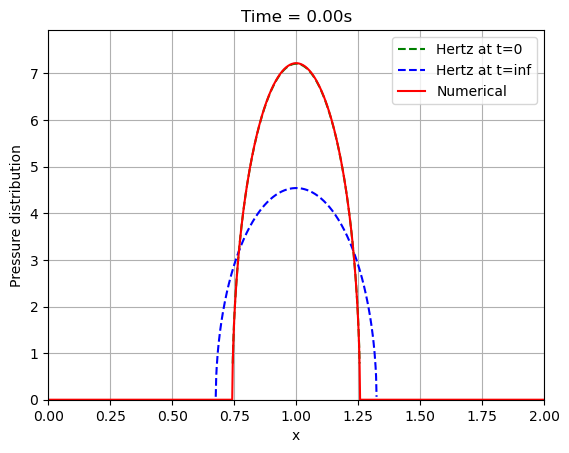

In [10]:
# define the update function for the animation
def update(frame):
    ax.clear()
    ax.set_xlim(0, L)
    ax.set_ylim(0, 1.1*p0_t0)
    ax.grid()

    # draw Hertzian contact theory reference
    ax.plot(x[n//2], p0_t0*np.sqrt(1 - (x[n//2]-x0)**2 / a_t0**2), 'g--', label='Hertz at t=0')
    ax.plot(x[n//2], p0_t_inf*np.sqrt(1 - (x[n//2]-x0)**2 / a_t_inf**2), 'b--', label='Hertz at t=inf')

    # draw numerical solution at current time step
    ax.plot(x[n//2], pressure_distributions[frame], 'r-', label='Numerical')
    ax.set_title(f"Time = {t0 + frame * dt:.2f}s")
    plt.xlabel("x")
    plt.ylabel("Pressure distribution")
    plt.legend()

pressure_distributions = []
for t in np.arange(t0, t1, dt):

    M_maxwell[:] = 0
    for k in range(len(G)):
        M_maxwell += gamma[k]*M[k] 
    H_new = alpha*Surface - beta*U + M_maxwell

    #main step1: Compute $P_{t+\Delta t}^{\prime}$
    M_new, P = contact_solver(n, m, W, S, H_new, tol=1e-6, iter_max=200)

    ##main step2: Update global displacement
    U_new = (1/alpha)*(M_new - M_maxwell + beta*U)

    #main step3: Update the pressure
    for k in range(len(G)):
        M[k] = gamma[k]*(M[k] + G[k]*(U_new - U))
    #only maxwell branch, see algorithm formula 1 in the notebook

    Ac.append(np.mean(P > 0)*S)
    #optional: Sanity check
    if not np.allclose(M_new, M_maxwell + G_inf*U_new, atol=1e-6):
        print('Sanity check failed!')

    #main step4: Update the total displacement field
    U = U_new

    pressure_distributions.append(P[n//2].copy())  # store the pressure distribution at each time step

# create a figure and axis
fig, ax = plt.subplots()

# create an animation
ani = FuncAnimation(fig, update, frames=len(pressure_distributions), repeat=False)

HTML(ani.to_jshtml())
#plt.show()

! Here we can see from output that sanity check failed!

In [11]:

Ac_hertz_t0 = np.pi*a_t0**2
Ac_hertz_t_inf = np.pi*a_t_inf**2

print("Analytical contact area radius at t0:", a_t0)
print("Analytical contact area radius at t_inf:", a_t_inf)
print("Analytical maximum pressure at t0:", p0_t0)
print("Analytical maximum pressure at t_inf:", p0_t_inf)
print("Numerical contact area at t0:", Ac[0])
print("Numerical contact area at t_inf",  Ac[-1])
print("Analyical contact area at t0:", Ac_hertz_t0)
print("Analyical contact area at t_inf:", Ac_hertz_t_inf)

Analytical contact area radius at t0: 0.2573571246000447
Analytical contact area radius at t_inf: 0.32424965862401395
Analytical maximum pressure at t0: 7.20889989952245
Analytical maximum pressure at t_inf: 4.541322364996685
Numerical contact area at t0: 0.20810317993164062
Numerical contact area at t_inf 0.2589759826660156
Analyical contact area at t0: 0.20807613101957023
Analyical contact area at t_inf: 0.3303002692699386


### Result analysis for slop at $t_0$ and $t_{\infty}$:

In [12]:
# Calculate the slope of the tangent line at the first time step
slope_t0 = (Ac[1] - Ac[0]) / dt

# Calculate the slope of the tangent line at the last time step
slope_t1 = (Ac[-1] - Ac[-2]) / dt

### Caluculate the slope of the reference tangent line

We know that the transition process won't show an exponential behaviour beacuse the contact area changes along with time, and in mathmatics, this transition percentage never reach 100%. In physics, we can say the transition will approach the limit at $t_{\infty}$:


In [13]:
relaxation_1tau = 1 - np.exp(-1)
relaxation_2tau = 1 - np.exp(-2)
relaxation_3tau = 1 - np.exp(-3)

print(relaxation_1tau, relaxation_2tau, relaxation_3tau)

0.6321205588285577 0.8646647167633873 0.950212931632136


Here at $t_0$, when the contact area haven't change too much, we can expect the slope of the tangent line at the first time step could fit the analytical slope(reference).

The radius of the contact area for non-adhesive elastic material is given by:

$$
a=\left(\frac{3 P R}{4 E^*}\right)^{\frac{1}{3}}
$$

Then the contact area will be:

$$
A=\pi a^2=\pi\left(\frac{3 P R}{4 E^*}\right)^{\frac{2}{3}}
$$

Now, we introduce $E^*(t)$ for viscoelastic:

$$
A(t)=\pi\left(\frac{3 P R}{4 E^*(t)}\right)^{\frac{2}{3}} \quad \text { for } t \ll \tau \text {(short time)}
$$

And we can express $E^*(t)$ as:
$$
E^*(t)=E_{\infty}^*+\left(E_0^*-E_{\infty}^*\right) e^{-\frac{t}{\tau}}
$$

where $E^*(t=0)=E_0^*$, $E^{* \prime}(t)=-\frac{E_0^*-E_{\infty}^*}{\tau} e^{-\frac{t}{\tau}}, E^*(0)=\frac{E_{\infty}^*-E^*_0}{\tau}$

Then, the analytical slope at $t_0$ should be:

$$
\begin{aligned}
A^{\prime}(t) & =\pi\left(\frac{3 P R}{4}\right)^{\frac{2}{3}}\left(\left(E^*(t)\right)^{-\frac{2}{3}}\right)^{\prime} \\
& =\pi\left(\frac{3 P R}{4}\right)^{\frac{2}{3}} \cdot\left(-\frac{2}{3}\right) \cdot E^{* \prime}(t) \cdot\left(E^*(t)\right)^{-\frac{5}{3}}
\end{aligned}
$$

with $E^{* \prime}(0)=E^*(0)=\frac{E_{\infty}^*-E^*_0}{\tau}$

$$
A^{\prime}(0) \approx \pi \cdot\left(\frac{3 P R}{4}\right)^{\frac{2}{3}} \cdot \frac{2}{3}\left(\frac{E_0^*-E_{\infty}^*}{\tau}\right) \cdot E_0^{-\frac{5}{3}}
$$

where $\frac{E_0^*-E_{\infty}^*}{\tau} \approx \frac{1}{\tau}$ at $t=t_0$

## Question: Do we apply correctly for $E^*_0$ and $E^*_{\infty}$ ? 

And here, to simplify the deduce process, we have only one branch with one tau

In [14]:
# Caluculate the reference slope
P = W / S
#E_effective_t0 = 2*G_effective_t0*(1+nu)/(1-nu**2)
#E_effective_inf = 2*G_inf*(1+nu)/(1-nu**2)
#E_0 = 2 * G_effective_t0 * (1 + nu)
E_0 = 2 * (G[0]+G_inf) * (1 + nu)
#slope_t0_ref = np.pi * (3*P*R/4)**(2/3) * (2/3) * ((E_0_star-E_inf_star)/tau[0]) * E_0**(-5/3)
slope_t0_ref = np.pi * (3*P*R/4)**(2/3) * (2/3) * ((E_effective_t0-E_effective_inf)/tau[0]) * E_effective_t0**(-5/3)


#### Since we do simulation for $t=\tau$

$$
\begin{aligned}
A^{\prime}(t=\tau) & = \pi\left(\frac{3 P R}{4}\right)^{\frac{2}{3}} \cdot\left(-\frac{2}{3}\right) \cdot E^{* \prime}(t) \cdot\left(E^*(t)\right)^{-\frac{5}{3}}\\
& = \pi\left(\frac{3 P R}{4}\right)^{\frac{2}{3}} \cdot\left(\frac{2}{3}\right) \cdot (\frac{E_0^*-E_{\infty}^*}{\tau \cdot e}) \cdot \left(E_{\infty}^*+\left(\frac{E_0^*-E_{\infty}^*}{e}\right) \right)^{-\frac{5}{3}}
\end{aligned}
$$

In [15]:

slope_t1_ref = np.pi * (3*P*R/4)**(2/3) * (2/3) * ((E_effective_t0-E_effective_inf)/tau[0]/np.e) * (E_effective_inf+(E_effective_t0-E_effective_inf)/np.e)**(-5/3)

##### Add reference contact area with viscoelastic modulus

We know for short time $( t \ll \tau )$, we have:

$$
A(t)=\pi\left(\frac{3 P R}{4 E^*(t)}\right)^{\frac{2}{3}} 
$$

And we can express $E^*(t)$ as:
$$
E^*(t)=E_{\infty}^*+\left(E_0^*-E_{\infty}^*\right) e^{-\frac{t}{\tau}}
$$


In [33]:
Ac_visco_ref = []
for t in np.arange(t0, t1, dt):    
    E_star_visco = E_effective_inf + (E_effective_t0 - E_effective_inf)**np.exp(-t/tau[0])
    Ac_visco_ref.append(np.pi * (3*P*R/4/E_star_visco)**(2/3))



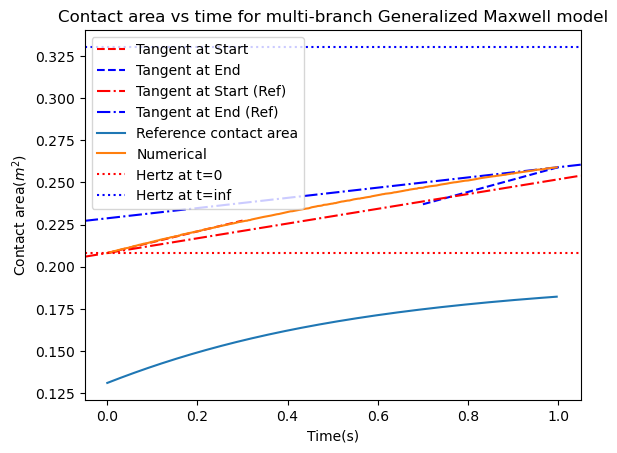

In [34]:
# Define the length of tangent lines
tangent_length = 0.3  # Smaller range for tangent line visualization

# Plot the tangent lines
plt.plot([t0, t0 + tangent_length], [Ac[0], Ac[0] + slope_t0 * tangent_length], 'r--', label='Tangent at Start')
plt.plot([t1 - tangent_length, t1], [Ac[-1] - slope_t1 * tangent_length, Ac[-1]], 'b--', label='Tangent at End')

# Plot the reference tangent lines
plt.axline([t0, Ac[0]], slope=slope_t0_ref, color='r', linestyle='-.',label='Tangent at Start (Ref)')
plt.axline([t1, Ac[-1]], slope=slope_t1_ref, color='b', linestyle='-.', label='Tangent at End (Ref)')

# Plot the reference contact area vs time
plt.plot(np.arange(t0, t1, dt), Ac_visco_ref)

plt.plot(np.arange(t0, t1, dt), Ac)
plt.axhline(Ac_hertz_t0, color='red', linestyle='dotted')
plt.axhline(Ac_hertz_t_inf, color='blue', linestyle='dotted')
plt.xlabel("Time(s)")
plt.ylabel("Contact area($m^2$)")
plt.legend(["Tangent at Start", "Tangent at End", "Tangent at Start (Ref)", "Tangent at End (Ref)", "Reference contact area", "Numerical", "Hertz at t=0", "Hertz at t=inf"])
#define a title that can read parameter tau_0
plt.title("Contact area vs time for multi-branch Generalized Maxwell model")
#plt.axhline(Ac_hertz_t_inf, color='blue')
plt.show()



#### plot the log plot?

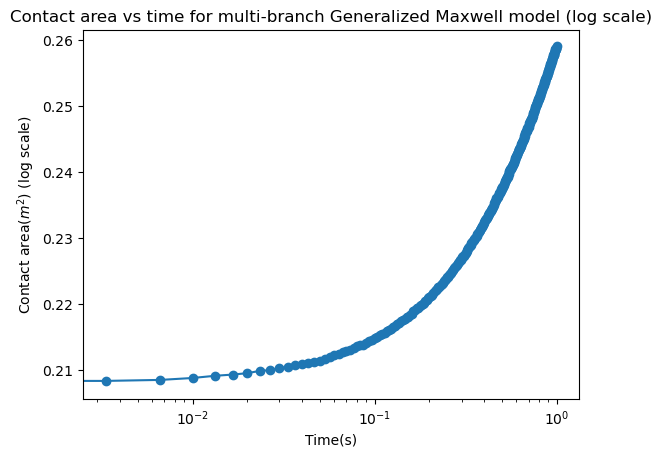

In [20]:
# Plot the log plot
plt.plot(np.arange(t0, t1, dt), Ac, 'o-')

#plt.yscale('log')
plt.xscale('log')
plt.ylabel("Contact area($m^2$) (log scale)")
plt.xlabel("Time(s)")
plt.title("Contact area vs time for multi-branch Generalized Maxwell model (log scale)")
plt.show()


In [23]:


start = 0  # Start value
stop = 1  # Stop value
num = 300  # Number of elements

log_values = np.geomspace(start, stop, num)
plt.plot(log_values, Ac)

#plt.yscale('log')
plt.xscale('log')
plt.ylabel("Contact area($m^2$) (log scale)")
plt.xlabel("Time(s)")
plt.title("Contact area vs time for multi-branch Generalized Maxwell model (log scale)")
plt.show()

ValueError: Geometric sequence cannot include zero

$$
A(t)=\underbrace{A_0+A^{\prime}(0) t }_{\text {fist order approximation }}+A^{\prime \prime}(0) \frac{t^2}{2}
$$